# Table of Contents

1. [Objective](#Objective)

2. [Data](#Data)

    - [Dataset description](#Dataset-description)

    - [Basic data Exploration](#Basic-data-exploration)

3. [Target analysis](#Target-analysis)

    - [Unique images per target class](#Unique-images-per-target-class)

    - [Number of annotation per target class](#Number-of-annotation-per-target-class)

    - [Sample images](#Sample-images-with-annotations.)

4. [Bounding box center analysis](#Bounding-box-center-analysis)

5. [Bounding box aspect ratio analysis](#Bounding-box-aspect-ratio-analysis)

6. [Bounding box width & height](#Bounding-box-width-&-height)

7. [Over lapping bounding box analysis](#Over-lapping-bounding-box-analysis)

8. [Bounding box area analysis](#Bounding-box-area-analysis)

9. [Bounding box anchor analysis](#Bounding-box-anchor-analysis)

10. [Basic image information analysis](#Basic-image-information-analysis)

11. [Test data analysis](#Test-data-analysis)

## Objective



#### Create a machine learning model that can detect the trophozoite stage of malaria, and differentiate between infected and uninfected blood cells.


#### Competition hosted on [Zindi](https://zindi.africa/competitions/lacuna-malaria-detection-challenge)

#### Packages and libraries

#### Import necessary packages and libraries

In [1]:
import pandas as pd #dataframe manipulation

pd.set_option('display.max_columns', 50)

import numpy as np  #for numerical process

import seaborn as sns #for visualization

from matplotlib import pyplot as plt #for visua lization

from PIL import Image, ImageDraw #for read the image

import skimage.color

import skimage.util

from skimage.measure import shannon_entropy, blur_effect

import imagehash #for calculation hash value of image

import cv2 #for read the image

import os

import itertools

import shutil

import time

import re

import math

%matplotlib inline

from tqdm.notebook import tqdm

import warnings

warnings.filterwarnings("ignore")

from concurrent.futures import ThreadPoolExecutor, ProcessPoolExecutor,as_completed

from itertools import combinations

from sklearn.cluster import KMeans

## Data

#### About the Dataset




#### Dataset description

```

The images in the dataset were captured by placing a smartphone over a microscope to capture the Field of View (FOV) of the blood slide through the eyepiece of the microscope. Along with the image, the slide from which the image was captured, the stage micrometer readings of the microscope, and the objective lens settings were recorded, and a maximum of 40 images was captured from each slide.

This blood slide image dataset was curated to facilitate using Computer Vision techniques for quick and accurate diagnosis of malaria in low-resource settings. This dataset adds to existing malaria microscopy datasets and can be used to improve machine learning models to generalise to data collected in other communities like Uganda.

There are 2 747 images in the train and 1 178 in the test.


```



### For more details about the data visit [Zindi](https://zindi.africa/competitions/lacuna-malaria-detection-challenge)

#### Basic data exploration

#### Load csv data

In [2]:
train = pd.read_csv("/kaggle/input/lacuna-malaria-detection-dataset/Train.csv") #train dataset

train_image_path = "/kaggle/input/lacuna-malaria-detection-dataset/images/" #image path

In [3]:
test = pd.read_csv("/kaggle/input/lacuna-malaria-detection-dataset/Test.csv") #test dataset

#### Structure of train dataset

In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23530 entries, 0 to 23529
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Image_ID    23530 non-null  object 
 1   class       23530 non-null  object 
 2   confidence  23530 non-null  float64
 3   ymin        23530 non-null  int64  
 4   xmin        23530 non-null  int64  
 5   ymax        23530 non-null  int64  
 6   xmax        23530 non-null  int64  
dtypes: float64(1), int64(4), object(2)
memory usage: 1.3+ MB


#### Unique images

In [5]:
train['Image_ID'].nunique()

2747

#### The above information shows that there are 2747 unique images with 23530 annotations.

#### Glimpse of train data

In [6]:
train.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax
0,id_u3q6jdck4j.jpg,Trophozoite,1.0,712,1241,737,1270
1,id_a6cl90trri.jpg,Trophozoite,1.0,558,1566,600,1604
2,id_qvc2le9sm8.jpg,Trophozoite,1.0,1317,2788,1448,2914
3,id_w8xnbd5rvm.jpg,Trophozoite,1.0,925,1744,1041,1823
4,id_6dop09rk02.jpg,NEG,1.0,0,0,0,0


## Target analysis

#### Let's see the target column distribution

#### Unique images per target class

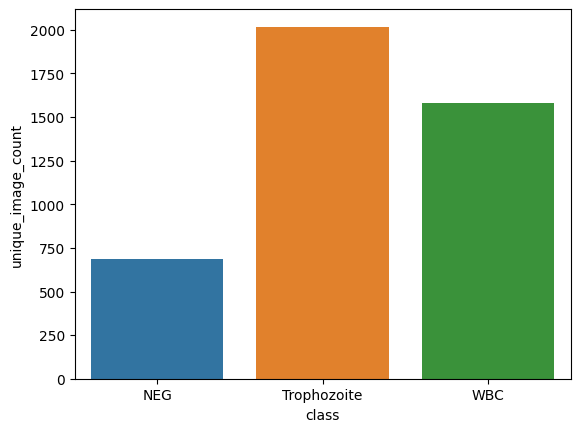

In [7]:
sns.barplot(train.groupby('class')['Image_ID'].nunique().reset_index().rename(columns={'Image_ID':'unique_image_count'}),

              x='class',y='unique_image_count');

In [8]:
train.groupby('class')['Image_ID'].nunique().reset_index().rename(columns={'Image_ID':'unique_image_count'})

,class,unique_image_count
0,NEG,688
1,Trophozoite,2018
2,WBC,1583


#### Number of annotation per target class

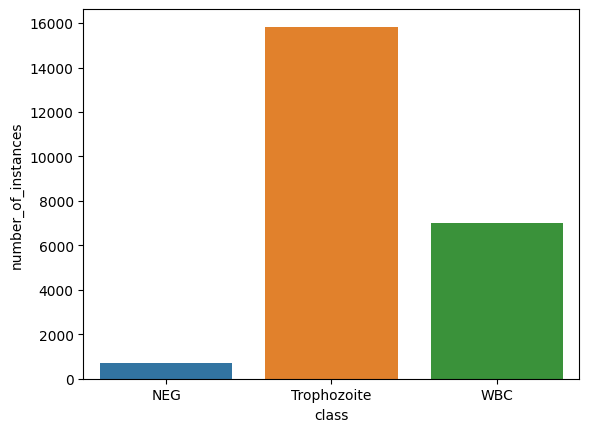

In [9]:
sns.barplot(train.groupby('class')['Image_ID'].agg({'count'}).reset_index().rename(columns={'count':'number_of_instances'}),

              x='class',y='number_of_instances');

In [10]:
train.groupby('class')['Image_ID'].agg({'count'}).reset_index().rename(columns={'count':'number_of_instances'})

,class,number_of_instances
0,NEG,688
1,Trophozoite,15838
2,WBC,7004


#### The plot and summary explain that most blood slide images are Trophozoite.

#### Each image has one or more annotations. Let's calculate the number of annotations for each image.

In [11]:
train['total_annotation']=train.groupby('Image_ID')['Image_ID'].transform('count')

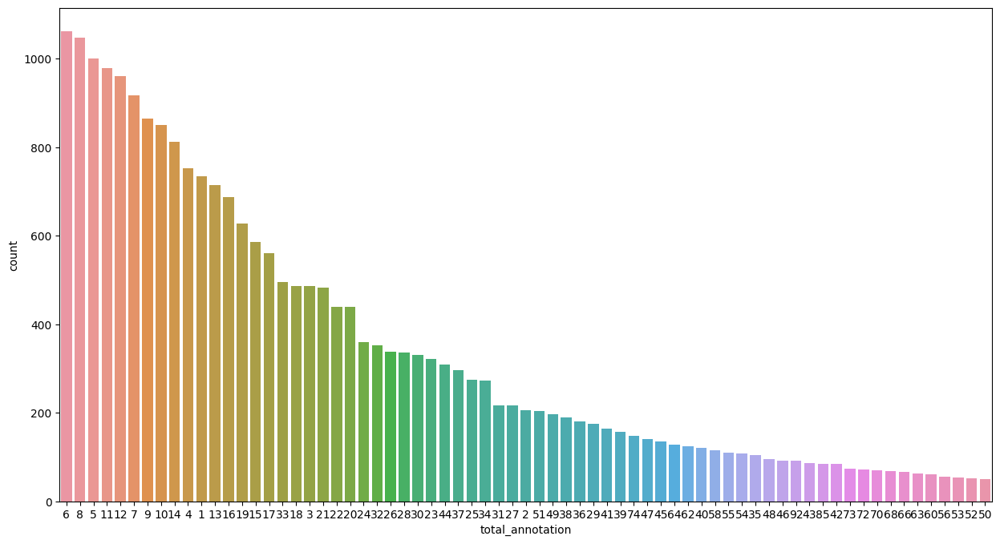

In [12]:
_=plt.figure(figsize=(15,8))

sns.countplot(x=train['total_annotation'], order=train['total_annotation'].value_counts().index);

In [13]:
train['total_annotation'].describe()

count    23530.000000
mean        20.722227
std         17.197164
min          1.000000
25%          8.000000
50%         15.000000
75%         29.000000
max         92.000000
Name: total_annotation, dtype: float64

#### The plot and summary above explain that the number of annotations per image ranges from 1 to 92.

#### Sample images with annotations.

In [14]:
train[train['Image_ID']=='id_u3q6jdck4j.jpg'] 

,Image_ID,class,confidence,ymin,xmin,ymax,xmax,total_annotation
0,id_u3q6jdck4j.jpg,Trophozoite,1.0,712,1241,737,1270,4
10824,id_u3q6jdck4j.jpg,Trophozoite,1.0,652,1405,691,1442,4
13595,id_u3q6jdck4j.jpg,Trophozoite,1.0,458,1462,487,1491,4
18536,id_u3q6jdck4j.jpg,WBC,1.0,129,789,190,855,4


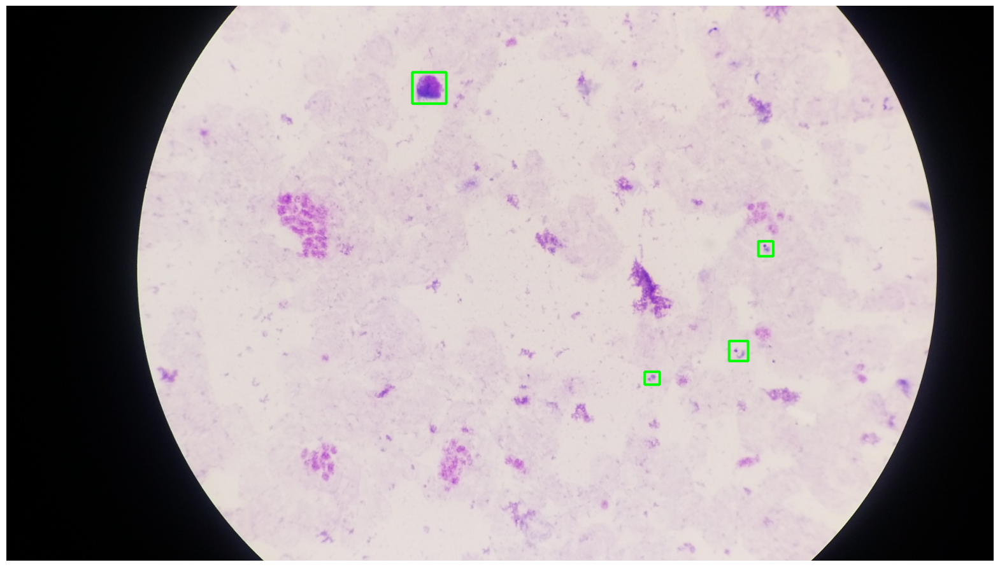

In [15]:
_=plt.figure(figsize=(20,20))

imgs = cv2.imread(f"{train_image_path}id_u3q6jdck4j.jpg")

imgs = cv2.cvtColor(imgs, cv2.COLOR_BGR2RGB)

bbox_df = train[train['Image_ID']=='id_u3q6jdck4j.jpg'] 

for index, row in bbox_df.iterrows():

        bbbox_res=row[['xmin','ymin','xmax','ymax']].tolist()

        imgs=(cv2.rectangle(imgs,(bbbox_res[0],bbbox_res[1]),

                                          (bbbox_res[2],bbbox_res[3]),(0,255,0),3))

plt.axis('off');        

plt.imshow(imgs);


In [16]:
#Read image

def img_read(path,im ,new_size=None):

    img = cv2.imread(f"{path}{im}")

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    #img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    if new_size:

        img=cv2.resize(img,(new_size,new_size))

        return img

    else:

        return img



#image bbbox_annotate

def bbbox_annotate(img,bbox_df,bbox_line_size,new_size=False):

    #bbox_clr=(0,255,0)

    if new_size:

        y_ = img.shape[0]

        x_ = img.shape[1]

        x_scale = new_size / x_

        y_scale = new_size / y_

        img=cv2.resize(img,(new_size,new_size))

        for index, row in bbox_df.iterrows():

            bbbox_res=row[['xmin','ymin','xmax','ymax']].tolist()

            if row['class']=='Trophozoite':

                bbox_clr=(255,0,0)

            elif row['class']=='WBC':

                bbox_clr=(255,255,0)
                
            elif row['class']=='NEG':

                bbox_clr=(0,255,0)

                

            imgs=(cv2.rectangle(img,(int(np.round(bbbox_res[0]*x_scale)),int(np.round(bbbox_res[1]*y_scale))),

                                          (int(np.round(bbbox_res[2]*x_scale)),int(np.round(bbbox_res[3]*y_scale))),

                                bbox_clr,bbox_line_size))

        return imgs

    else:

        for index, row in bbox_df.iterrows():

            bbbox_res=row[['xmin','ymin','xmax','ymax']].tolist()

            if row['class']=='Trophozoite':

                bbox_clr=(255,0,0)

            elif row['class']=='WBC':

                bbox_clr=(255,255,0)
                
            elif row['class']=='NEG':

                bbox_clr=(0,255,0)

      

            imgs=(cv2.rectangle(img,(bbbox_res[0],bbbox_res[1]),

                                          (bbbox_res[2],bbbox_res[3]),bbox_clr,bbox_line_size))

        return imgs






In [17]:
#Auto figure resize 

def auto_figsize(nrows, ncols, base_width=6, base_height=6):

    width = base_width * ncols

    height = base_height * nrows

    return (width, height)

#show sample images with bbox

def show_image_with_annotation(df,image_list,n_row=None,n_col=None,bbox_line_size=None):

    if bbox_line_size is None:

        bbox_line_size=1

    if n_row is None or n_col is None:

        n_row = math.ceil(math.sqrt(len(set(image_list))))

        n_col = math.ceil(len(set(image_list)) / n_row)

        

    #fig, axs = plt.subplots(n_row, n_col ,figsize=auto_figsize(n_row,n_col))

    #axs = np.array(axs).reshape(-1) if n_row > 1 or n_col > 1 else np.array([axs])

        

    fig=plt.subplots(figsize=auto_figsize(n_row,n_col))

    for i,im in enumerate(set(image_list)):

        img=img_read(train_image_path,im)

        h,w=img.shape[0],img.shape[1]

        _=plt.subplot(n_row,n_col,i+1,)

        plt.imshow(bbbox_annotate(img,df[df['Image_ID']==im].loc[:,['class','xmin','ymin','xmax','ymax']],

                                 new_size=512,bbox_line_size=bbox_line_size))#,aspect='auto')



        for target in df[df['Image_ID']==im]['class'].unique():



            if target == 'Trophozoite':

                plt.text(20, 20, 'Trophozoite', bbox={'facecolor': 'red', 'pad': 3,},ha='left',va='top')

               

            elif target == 'WBC':

                plt.text(20, 40, 'WBC', bbox={'facecolor': 'yellow', 'pad': 3,},color='red',ha='left',va='top')
                
            elif target == 'NEG':
                
                plt.text(20, 60, 'NEG', bbox={'facecolor': 'lime', 'pad': 3,},color='white',ha='left',va='top')

        plt.title(f"Image Name: {im}")

        plt.axis('off')

        

            

    plt.tight_layout()

    plt.show()

#### Let's view sample images with bbox annotation

In [18]:
train.groupby(['Image_ID','class'])['class'].agg({'count'}).reset_index().groupby(['Image_ID','class'])['class'].agg({'count'}).reset_index()

,Image_ID,class,count
0,id_0051lznyrt.jpg,Trophozoite,1
1,id_0051lznyrt.jpg,WBC,1
2,id_00m1onu6hj.jpg,NEG,1
3,id_00n92f65ke.jpg,NEG,1
4,id_00sirs797x.jpg,Trophozoite,1
...,...,...,...
4284,id_zyki7chovv.jpg,NEG,1
4285,id_zytohx1ml2.jpg,Trophozoite,1
4286,id_zz4ga0557e.jpg,Trophozoite,1
4287,id_zz4ga0557e.jpg,WBC,1


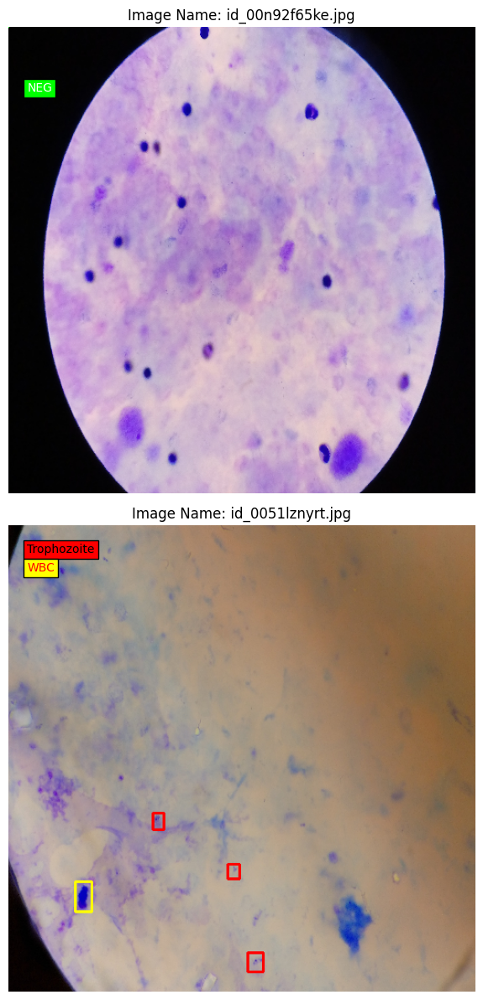

In [19]:
show_image_with_annotation(train,['id_0051lznyrt.jpg','id_00n92f65ke.jpg'],n_row=2,n_col=1,bbox_line_size=2)

## Bounding box center analysis

#### Let's find where center of the bounding box located are typically located within the image.The bounding box ceneters are calculated by averaging X and Y.

In [20]:
train['bbox_center_x'] = (train['xmin'] + train['xmax']) / 2

train['bbox_center_y'] = (train['ymin'] + train['ymax']) / 2

#### Bounding box centers by target class

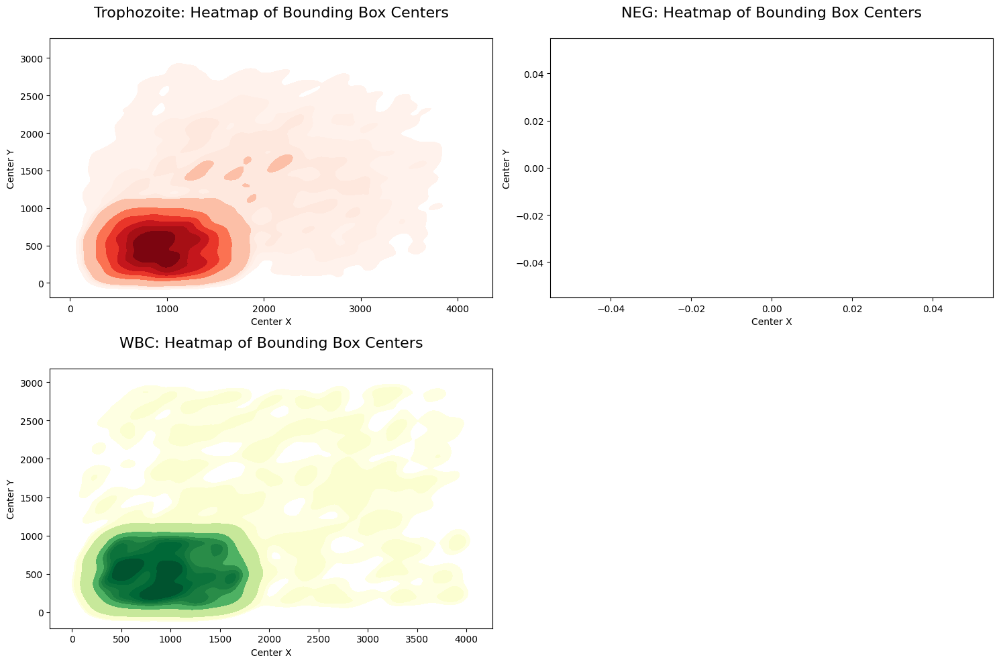

In [21]:
    

fig=plt.subplots(figsize=(15, 10))

for i,(label,clr)  in enumerate(zip(train['class'].unique(),["Reds", "Greens", "YlGn"])):    

    _=plt.subplot(2,2,i+1,)

    sns.kdeplot(data=train[train['class']==label],x='bbox_center_x', y='bbox_center_y', cmap=clr, shade=True, bw_adjust=.5)

    _=plt.title(f"{label}: Heatmap of Bounding Box Centers\n",fontsize=16)

    _=plt.xlabel("Center X")

    _=plt.ylabel("Center Y")

    _=plt.tight_layout()

plt.show()

#### Darker colors represent higher frequency bounding box centers, whereas lighter colors represent lower frequency bounding box centers.

#### The plot above explains that most of the bounding boxes are located in the left and lower-bottom region of the image.

## Bounding box aspect ratio analysis

In [22]:
def calculate_bbox_w_h(xmin, ymin, xmax, ymax):

    # Calculate width and height

    width = xmax - xmin

    height = ymax - ymin

    

    return [width,height]


In [23]:
train[['bbox_width','bbox_height']]=pd.DataFrame(train.apply(lambda x: calculate_bbox_w_h(x.xmin, x.ymin, x.xmax, x.ymax),axis=1).to_list(),index=train.index)

In [24]:
train['AspectRatio'] = round(train['bbox_width'] / train['bbox_height'],1)

In [25]:
train['AspectRatio'].describe()

count    22842.0
mean         inf
std          NaN
min          0.3
25%          0.9
50%          1.0
75%          1.1
max          inf
Name: AspectRatio, dtype: float64

#### The above summary indicates that there are infinity values in the aspect ratio column.

In [26]:
train[(train == np.inf).any(axis=1)]

,Image_ID,class,confidence,ymin,xmin,ymax,xmax,total_annotation,bbox_center_x,bbox_center_y,bbox_width,bbox_height,AspectRatio
12017,id_wd51nh9072.jpg,Trophozoite,1.0,690,520,690,579,68,549.5,690.0,59,0,inf


#### The mean and max values are infinite because one bounding box height is 0.

In [27]:
train[~(train == np.inf).any(axis=1)]['AspectRatio'].describe()

count    22841.000000
mean         1.001475
std          0.180595
min          0.300000
25%          0.900000
50%          1.000000
75%          1.100000
max          2.300000
Name: AspectRatio, dtype: float64

#### In the summary above, the average aspect ratio of the bounding boxes is 1. The bounding box aspect ratio ranges from 0.3 to 2.3. Seventy-five percent of the bounding boxes have an aspect ratio less than or equal to 1.1.

In [28]:
train[train['AspectRatio'] == 0.3]

,Image_ID,class,confidence,ymin,xmin,ymax,xmax,total_annotation,bbox_center_x,bbox_center_y,bbox_width,bbox_height,AspectRatio
13175,id_gh76ohnnje.jpg,Trophozoite,1.0,297,732,310,736,19,734.0,303.5,4,13,0.3


#### Bounding boxes with 0.3 aspect ratio

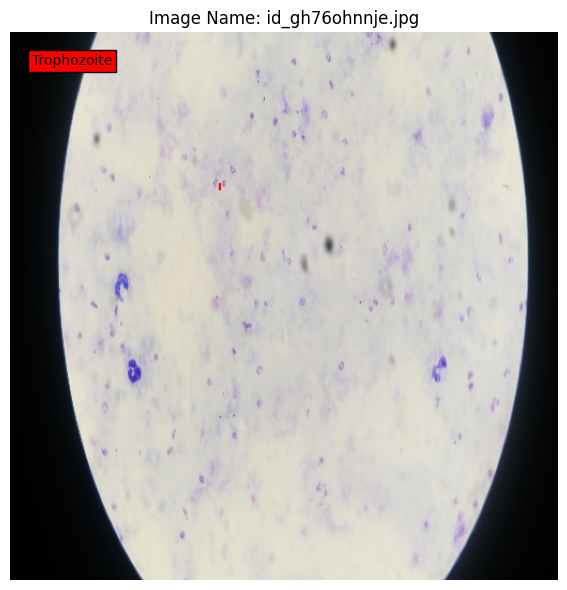

In [29]:
show_image_with_annotation(train[train['AspectRatio'] == 0.3],train[train['AspectRatio'] == 0.3]['Image_ID'],n_row=1,n_col=1)

#### Bounding box with 0 height

In [30]:
train[train['bbox_height'] == 0]['Image_ID'].nunique()

689

In [31]:
train[train['bbox_height'] == 0]['class'].value_counts()

class
NEG            688
Trophozoite      1
Name: count, dtype: int64

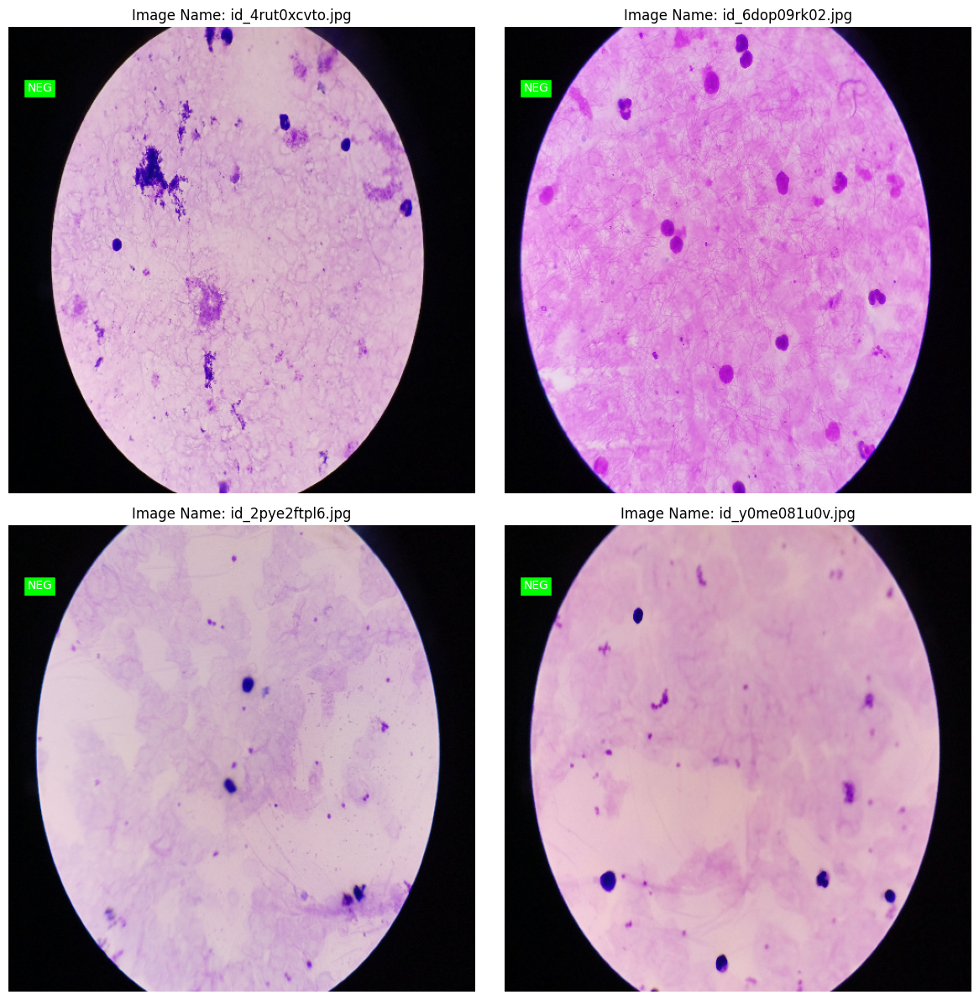

In [32]:
show_image_with_annotation(train,train[train['bbox_height'] == 0]['Image_ID'][:4],n_row=2,n_col=2)

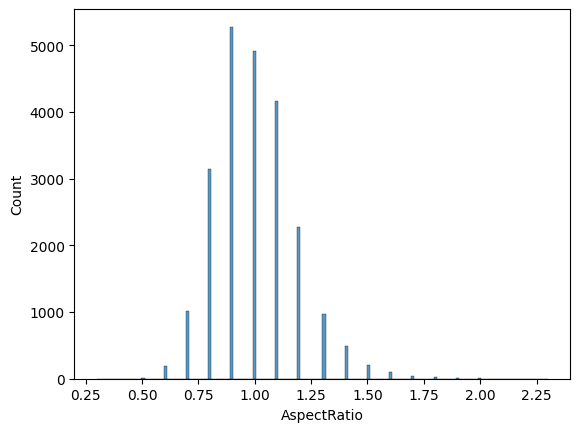

In [33]:
sns.histplot(data=train,x='AspectRatio');

In [34]:
train[train['bbox_height'] != 0]['AspectRatio'].describe()

count    22841.000000
mean         1.001475
std          0.180595
min          0.300000
25%          0.900000
50%          1.000000
75%          1.100000
max          2.300000
Name: AspectRatio, dtype: float64

#### The aspect ratio of bounding boxes in the train dataset ranges from 0.3 to 2.3.

#### The average aspect ratio of bounding boxes is 1, indicating that most of the bounding boxes are square or near square.

#### Let's see target class wise bounding box aspect ratio distribution

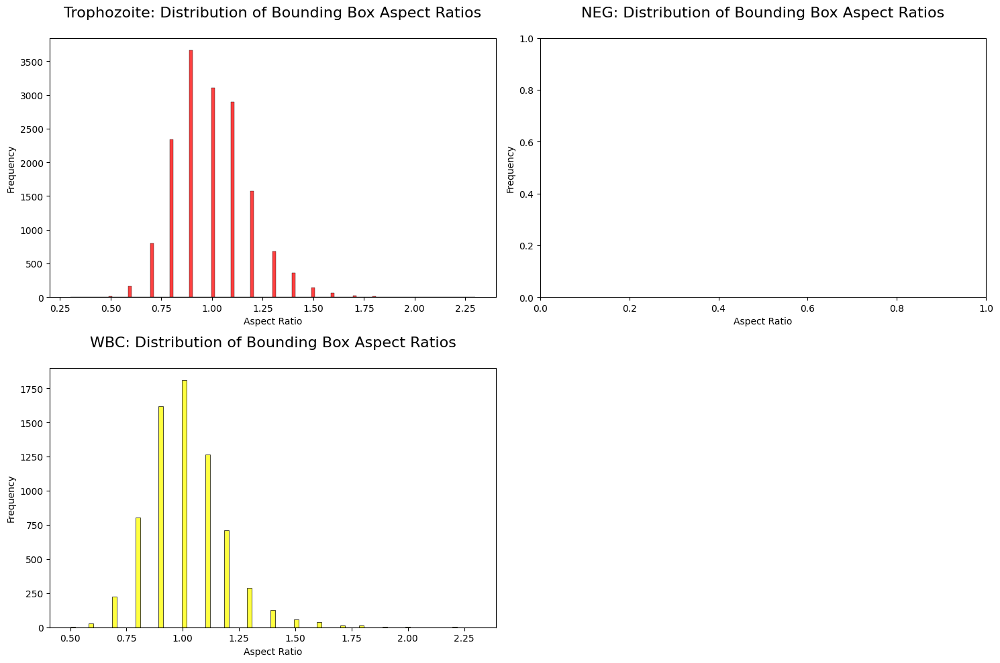

In [35]:
fig=plt.subplots(figsize=(15, 10))

for i,(label,clr)  in enumerate(zip(train['class'].unique(),["red","lime","yellow"])):    

    _=plt.subplot(2,2,i+1,)

    sns.histplot(data=train[train['bbox_height'] != 0][(train['class']==label)],x='AspectRatio',color=clr)

    _=plt.title(f"{label}: Distribution of Bounding Box Aspect Ratios\n",fontsize=16)

    _=plt.xlabel("Aspect Ratio")

    _=plt.ylabel("Frequency")

    _=plt.tight_layout()

plt.show()

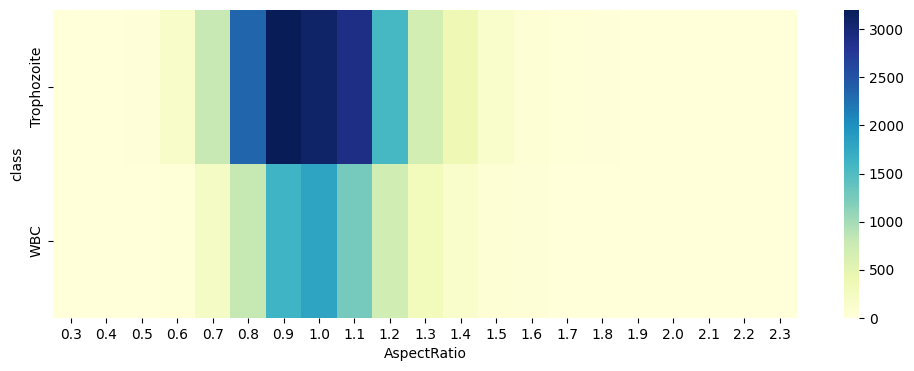

In [36]:
_=plt.figure(figsize=(12,4))

sns.heatmap(train[train['bbox_height'] != 0].groupby(['class','AspectRatio'])['class'].agg({'count'}).reset_index().pivot(index='class', columns='AspectRatio', values='count').fillna(0),

            robust=True,fmt='g',

           cmap="YlGnBu",

            annot_kws={"size": 15,

                      "weight": "bold"});

In [37]:
train[train['bbox_height'] != 0].groupby('class')['AspectRatio'].describe()

,count,mean,std,min,25%,50%,75%,max
class,,,,,,,,
Trophozoite,15837.0,0.996735,0.182794,0.3,0.9,1.0,1.1,2.3
WBC,7004.0,1.012193,0.175062,0.5,0.9,1.0,1.1,2.3


#### Trophozoite bbox have a larger range of aspect ratios compared to those labeled as WBC. 

#### Let's view bounding boxes with high aspect ratio

In [38]:
train[train['bbox_height'] != 0][np.isfinite(train['AspectRatio']) & (train['AspectRatio'] > 2)]

,Image_ID,class,confidence,ymin,xmin,ymax,xmax,total_annotation,bbox_center_x,bbox_center_y,bbox_width,bbox_height,AspectRatio
350,id_rnp8fcintk.jpg,WBC,1.0,16,1707,111,1918,20,1812.5,63.5,211,95,2.2
501,id_s15z5p4sev.jpg,WBC,1.0,263,772,363,982,7,877.0,313.0,210,100,2.1
2416,id_oepc5o47ei.jpg,Trophozoite,1.0,2230,984,2312,1170,5,1077.0,2271.0,186,82,2.3
9583,id_lw70dpk0sh.jpg,Trophozoite,1.0,809,2283,878,2431,5,2357.0,843.5,148,69,2.1
16096,id_dl2kaag27a.jpg,WBC,1.0,320,265,358,350,25,307.5,339.0,85,38,2.2
17812,id_yzhkb0zf37.jpg,Trophozoite,1.0,53,719,87,791,53,755.0,70.0,72,34,2.1
20015,id_1760ihasgs.jpg,WBC,1.0,6,942,44,1029,11,985.5,25.0,87,38,2.3


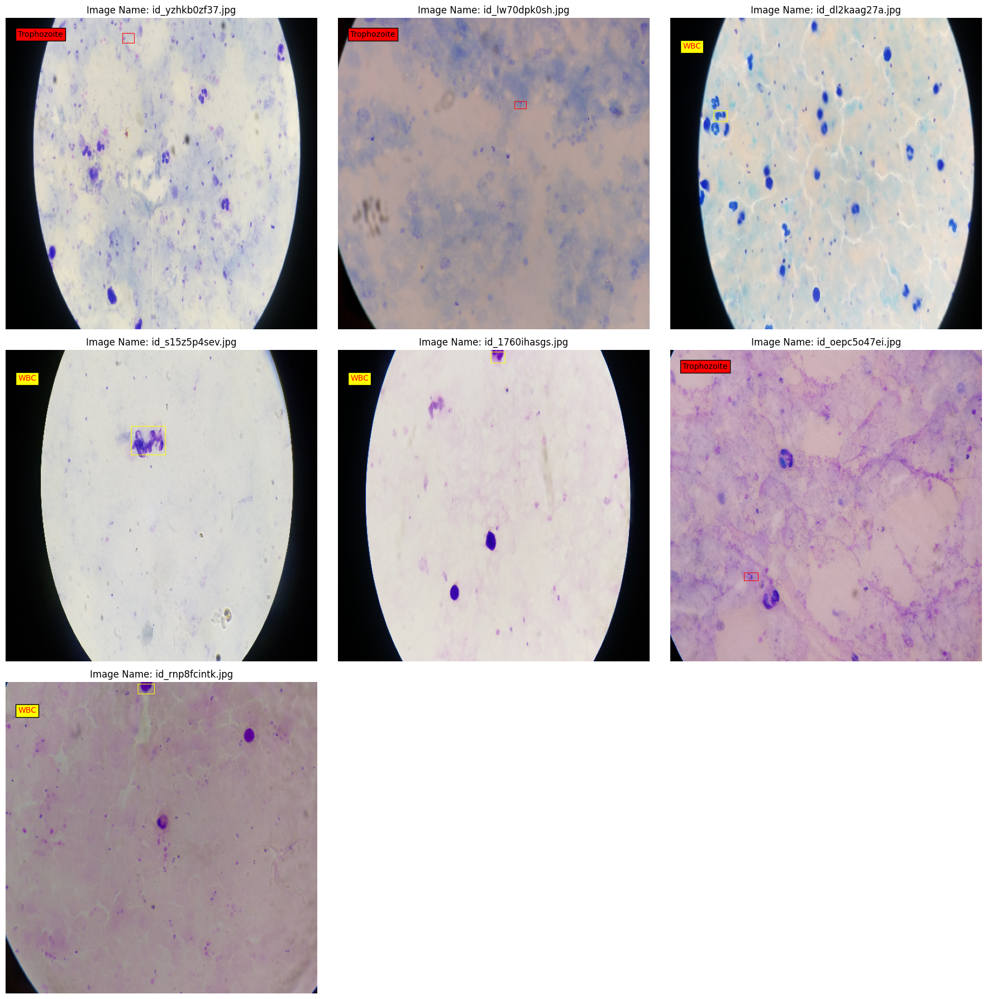

In [39]:
show_image_with_annotation(train[np.isfinite(train['AspectRatio']) & (train['AspectRatio'] > 2)],

                           train[np.isfinite(train['AspectRatio']) & (train['AspectRatio'] > 2)]['Image_ID'].values)

#### The high aspect ratio bounding boxes are belongs to the either the class WBC or Trophozoite.

## Bounding box width & height

#### Let's see distribution of bounding box width & height.

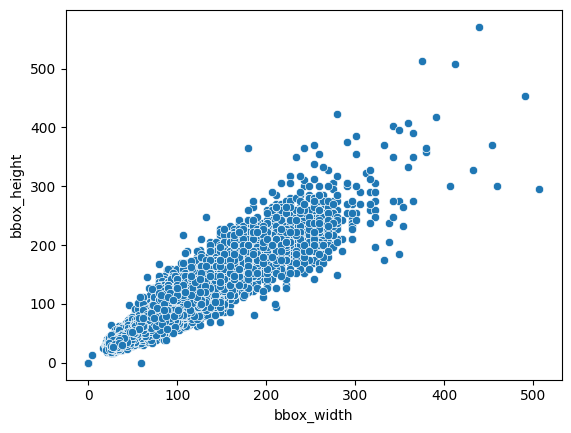

In [40]:
sns.scatterplot(data=train,x='bbox_width',y='bbox_height');

In [41]:
train[['bbox_width','bbox_height']].describe()

,bbox_width,bbox_height
count,23530.000000,23530.000000
mean,74.462558,75.460221
std,52.148619,52.205488
min,0.000000,0.000000
25%,36.000000,36.000000
50%,62.000000,62.000000
75%,98.000000,100.000000
max,507.000000,571.000000


#### Target class wise distribution of bounding box width & height.

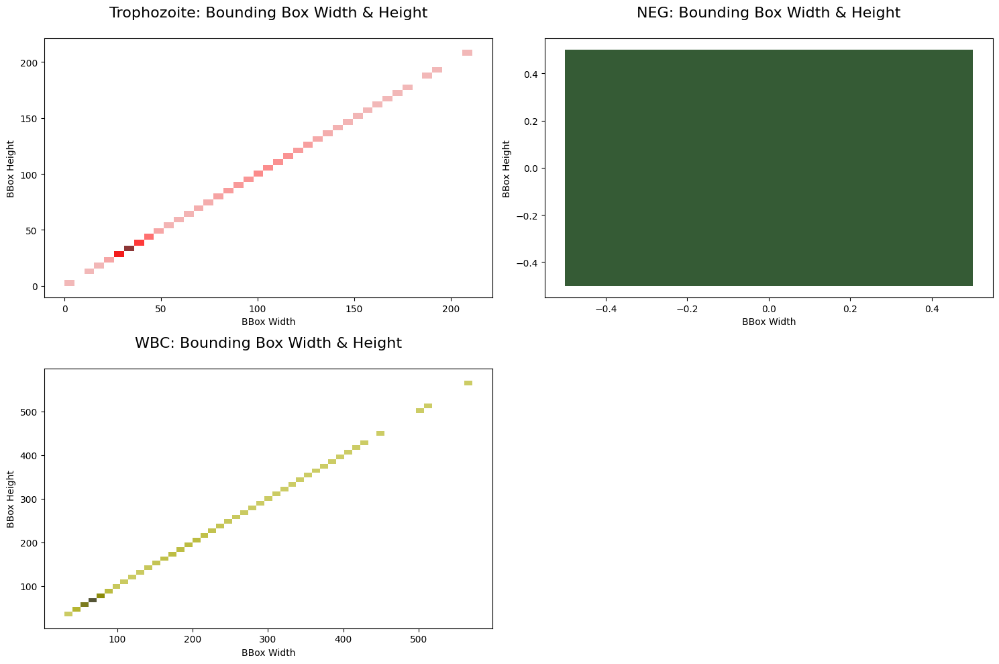

In [42]:
fig=plt.subplots(figsize=(15, 10))

for i,(label,clr)  in enumerate(zip(train['class'].unique(),["red","lime","yellow"])):    

    _=plt.subplot(2,2,i+1,)

    sns.histplot(data=train[train['class']==label],x='bbox_height',y='bbox_height',color=clr)

    _=plt.title(f"{label}: Bounding Box Width & Height\n",fontsize=16)

    _=plt.xlabel("BBox Width")

    _=plt.ylabel("BBox Height")

    _=plt.tight_layout()



In [43]:
train.groupby('class')[['bbox_width','bbox_height']].describe()

bbox_width                                                         \
                 count        mean        std   min   25%   50%    75%    max   
class                                                                           
NEG              688.0    0.000000   0.000000   0.0   0.0   0.0    0.0    0.0   
Trophozoite    15838.0   63.550638  35.980049   4.0  34.0  42.0   96.0  186.0   
WBC             7004.0  106.451885  66.120676  32.0  62.0  72.0  164.0  507.0   

            bbox_height                                                         
                  count        mean        std   min   25%   50%    75%    max  
class                                                                           
NEG               688.0    0.000000   0.000000   0.0   0.0   0.0    0.0    0.0  
Trophozoite     15838.0   65.080755  37.242075   0.0  34.0  42.0  100.0  211.0  
WBC              7004.0  106.343518  65.294707  30.0  62.0  72.0  164.0  571.0

## Over lapping bounding box analysis

#### Let's calculate the intersection over union and find any over lapping bounding boxes.

In [44]:
#calculate iou value between two bounding boxes

def iou(box1, box2):

    """Calculate the Intersection over Union (IoU) of two bounding boxes."""

    x1_min, y1_min, x1_max, y1_max = box1

    x2_min, y2_min, x2_max, y2_max = box2



    # Determine the coordinates of the intersection rectangle

    x_left = max(x1_min, x2_min)

    y_top = max(y1_min, y2_min)

    x_right = min(x1_max, x2_max)

    y_bottom = min(y1_max, y2_max)



    # Calculate the area of intersection

    if x_right < x_left or y_bottom < y_top:

        return 0.0

    intersection_area = (x_right - x_left) * (y_bottom - y_top)



    # Calculate the area of both bounding boxes

    box1_area = (x1_max - x1_min) * (y1_max - y1_min)

    box2_area = (x2_max - x2_min) * (y2_max - y2_min)



    # Calculate the IoU

    iou_value = intersection_area / float(box1_area + box2_area - intersection_area)

    return iou_value


In [45]:
def calculate_iou_pairs(args):

    df,ids,imagecol=args

    filtered_df = df[df[imagecol] == ids]

    box_indices = filtered_df.index.values

    overlapping_pairs = []

    for i, j in combinations(box_indices, 2):

        box1 = filtered_df.loc[i, ['xmin', 'ymin', 'xmax', 'ymax']].tolist()

        box2 = filtered_df.loc[j, ['xmin', 'ymin', 'xmax', 'ymax']].tolist()

        iou_value = iou(box1, box2)

        overlapping_pairs.append((i, j, iou_value))

    return overlapping_pairs





        

        

def get_iou_pairs(df,imagecol):

    image_ids = df[imagecol].unique()

    args = [(df[df[imagecol]==image_id], image_id, imagecol) for image_id in image_ids]

    

    with ProcessPoolExecutor() as executor:

        results=list(tqdm(executor.map(calculate_iou_pairs, args), total=len(image_ids),desc="Processing IoU Pairs"))

    return [pair for sublist in results for pair in sublist]

    

    

        

overlapping_pairs=get_iou_pairs(train,'Image_ID')

Processing IoU Pairs:   0%|          | 0/2747 [00:00<?, ?it/s]

#### Add iou value to the dataframe

In [46]:
def add_iou_to_row(df, pair_value):

    iou_dict = {}

    for index1, index2, value in tqdm(pair_value,desc='Adding IoU Values to the Dataframe'):

        iou_dict[index1] = value

        iou_dict[index2] = value

    

    



    df['IoU'] = df.index.map(iou_dict)

    

    return df   



train=add_iou_to_row(train, overlapping_pairs)

Adding IoU Values to the Dataframe:   0%|          | 0/232032 [00:00<?, ?it/s]

#### Let's view the number of images by the target class and IoU categories.

In [47]:
train['IoU']=round(train['IoU'],2)

In [48]:
target_iou_count=train.groupby(['class','IoU'])['Image_ID'].agg({'count'}).reset_index().pivot(index='class', columns='IoU', values='count').fillna(0)

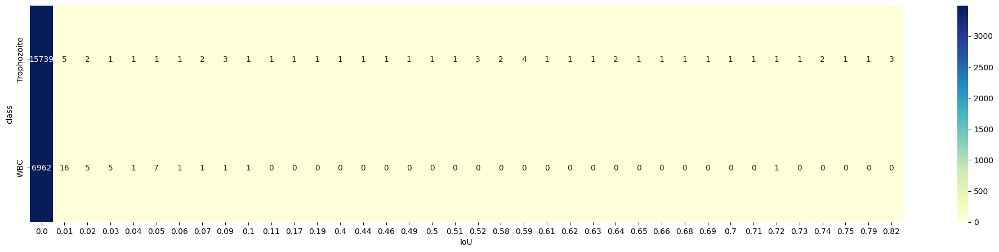

In [49]:
_=plt.figure(figsize=(25,5))

sns.heatmap(target_iou_count,robust=True,fmt='g',

           cmap="YlGnBu",annot=True);

#### The above plot illustrates that most image bounding boxes do not overlap.

#### Let's view bounding boxes with greater than 0.8 IoU value.

In [50]:
train['IoU'].describe()

count    22795.000000
mean         0.001102
std          0.025637
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          0.820000
Name: IoU, dtype: float64

In [51]:
train[train['IoU']>0.8]

,Image_ID,class,confidence,ymin,xmin,ymax,xmax,total_annotation,bbox_center_x,bbox_center_y,bbox_width,bbox_height,AspectRatio,IoU
4310,id_wij48tbsif.jpg,Trophozoite,1.0,518,1342,618,1427,13,1384.5,568.0,85,100,0.8,0.82
8803,id_ga85pu6228.jpg,Trophozoite,1.0,1860,777,1955,893,24,835.0,1907.5,116,95,1.2,0.82
17288,id_r1h52tth8l.jpg,Trophozoite,1.0,1035,904,1071,944,29,924.0,1053.0,40,36,1.1,0.82


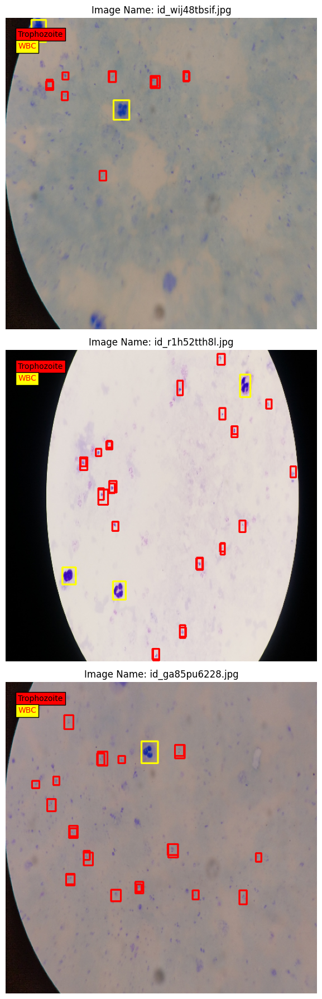

In [52]:
show_image_with_annotation( train,

                           train[train['IoU']>0.8]['Image_ID'],

                           bbox_line_size=2,n_col=1,n_row=3)

## Bounding box area analysis

#### Let's calculate the area of bounding box

In [53]:
train['bbox_area']=train.apply(lambda df:((df['xmax']-df['xmin'])*(df['ymax']-df['ymin'])), axis=1)

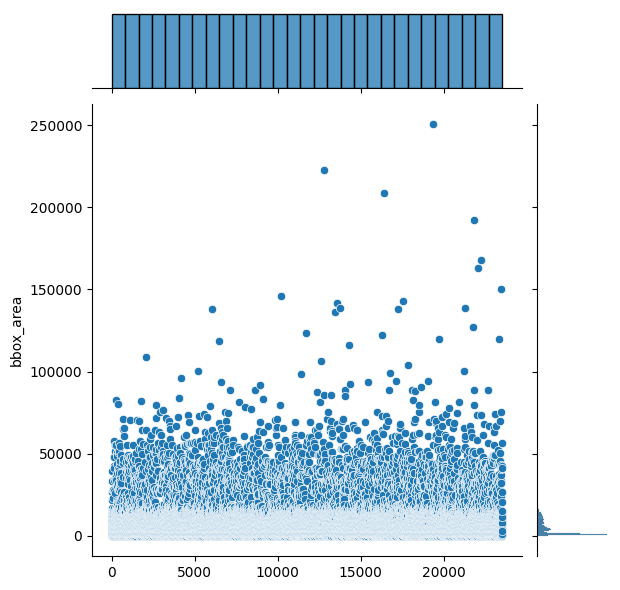

In [54]:
sns.jointplot(train['bbox_area']);

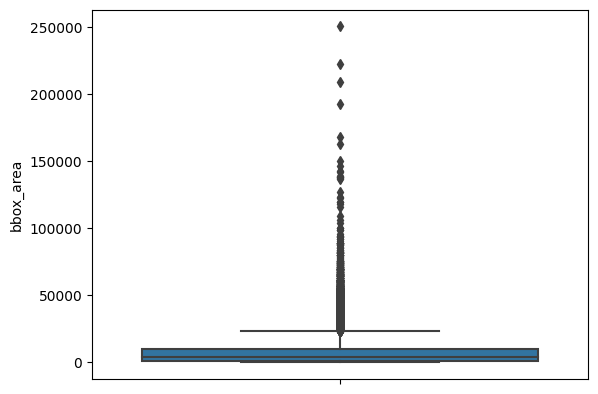

In [55]:
sns.boxplot(y=train['bbox_area']);

In [56]:
train['bbox_area'].describe()

count     23530.000000
mean       8222.295198
std       12489.632134
min           0.000000
25%        1230.500000
50%        3990.000000
75%       10070.000000
max      250669.000000
Name: bbox_area, dtype: float64

#### The above summary explains that the average area of the bounding box in the image is 8222.

#### The area of the bounding box in the image ranges from 0 to 250669.

#### Seventy-five percent of the bounding box areas are less than or equal to 10070.

#### Let's view sample images with high bbox area

In [57]:
train[train['bbox_area']>200000]

,Image_ID,class,confidence,ymin,xmin,ymax,xmax,total_annotation,bbox_center_x,bbox_center_y,bbox_width,bbox_height,AspectRatio,IoU,bbox_area
12793,id_8agv8nntb7.jpg,WBC,1.0,740,2774,1194,3265,12,3019.5,967.0,491,454,1.1,0.0,222914
16430,id_35bu6qgofu.jpg,WBC,1.0,2087,370,2594,782,17,576.0,2340.5,412,507,0.8,0.0,208884
19366,id_rcmgx74i4g.jpg,WBC,1.0,1136,2563,1707,3002,5,2782.5,1421.5,439,571,0.8,0.0,250669


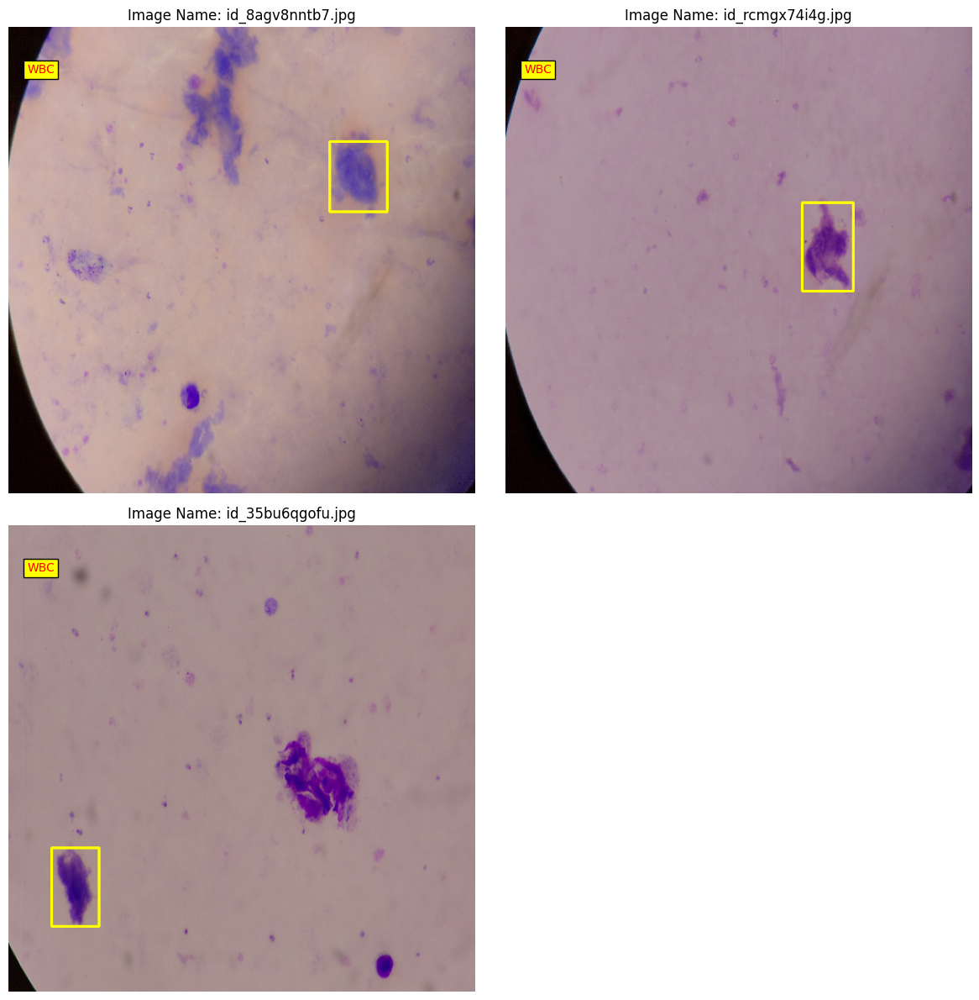

In [58]:
show_image_with_annotation(train[train['bbox_area']>200000],

                           train[train['bbox_area']>200000]['Image_ID'].unique(),

                           bbox_line_size=2)

## Bounding box anchor analysis

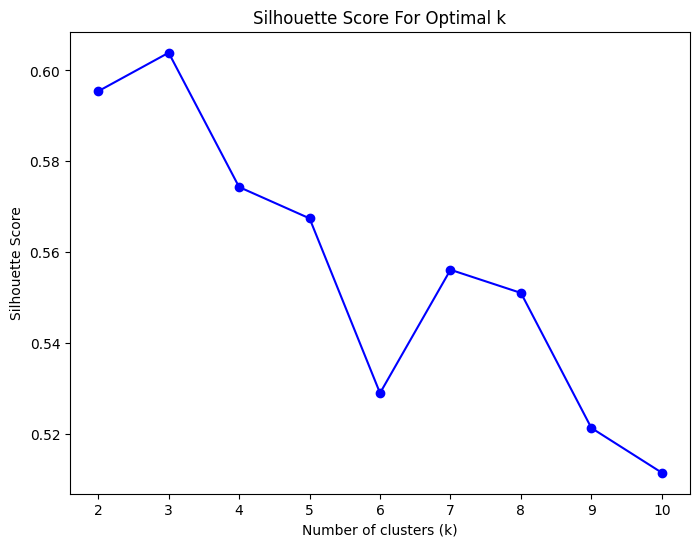

In [59]:
from sklearn.metrics import silhouette_score

# Prepare the data for clustering

data = train[['bbox_width', 'bbox_height']].values


silhouette_scores = []

for k in range(2, 11):  # k must be at least 2 for silhouette score
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(data)
    score = silhouette_score(data, labels)
    silhouette_scores.append(score)

# Plotting the silhouette scores
plt.figure(figsize=(8, 6))
plt.plot(range(2, 11), silhouette_scores, 'bo-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score For Optimal k')
plt.show()

In [60]:



# Number of clusters (anchor boxes)

kmeans = KMeans(n_clusters=3, random_state=0).fit(data)

cluster_centers = kmeans.cluster_centers_



# Extract anchor sizes from the cluster centers

anchor_sizes = cluster_centers.tolist()

print("Anchor Sizes (width, height):", anchor_sizes)

print("\n\nAspect Ratio:",cluster_centers[:, 0] / cluster_centers[:, 1])


Anchor Sizes (width, height): [[202.89394697348612, 201.66683341670665], [39.57918898240471, 39.94361132364253], [98.0048457629116, 100.50632312965237]]


Aspect Ratio: [1.00608486 0.99087658 0.97511124]


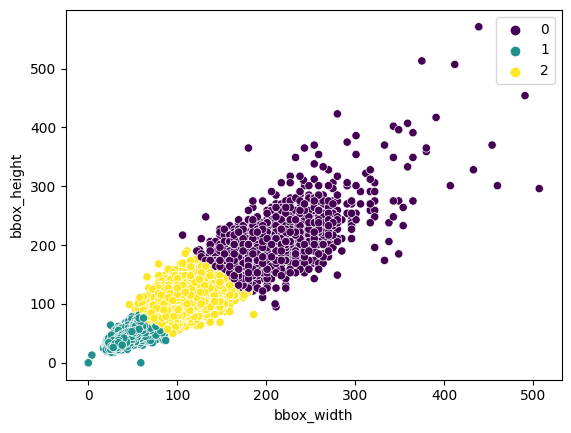

In [61]:
palette = sns.color_palette("viridis", as_cmap=True)

sns.scatterplot(train,x='bbox_width', y='bbox_height',hue=kmeans.labels_, palette = palette );

#### Bounding boxes are clustered into 3 categories.

## Basic image information analysis

#### Let's extract basic information about the image(compressed image data) like contrast, entropy.

In [62]:
def blur_effect(image):

    # Placeholder for blur effect calculation

    return cv2.Laplacian(image, cv2.CV_64F).var()



def process_image(args):

    path, image_id = args

    img_path = f"{path}{image_id}"

    img = Image.open(img_path)

    grey_img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    image_array = np.array(img)

    

    img_info = {

        'Image_ID': image_id,

        'img_mode': img.mode,

        'img_width': img.width,

        'img_height': img.height,

        'img_contrast': round(grey_img.std(),2),

        'img_entropy': round(shannon_entropy(image_array),2),

        'img_blur': round(blur_effect(np.array(img.convert('L'))),2)

    }

    return img_info



def basic_image_info(df, image_col, path):

    image_ids = df[image_col].unique()

    args = [(path, image_id) for image_id in image_ids]

    with ProcessPoolExecutor() as executor:

        results=list(tqdm(executor.map(process_image, args), total=len(image_ids),desc="Basic Image Information Extraction"))



    return pd.DataFrame(results)



train_image_basic_info = basic_image_info(train, 'Image_ID', train_image_path)

Basic Image Information Extraction:   0%|          | 0/2747 [00:00<?, ?it/s]

In [63]:
train_image_basic_info = pd.merge(train_image_basic_info,train[['Image_ID','class']],how='left',on='Image_ID')

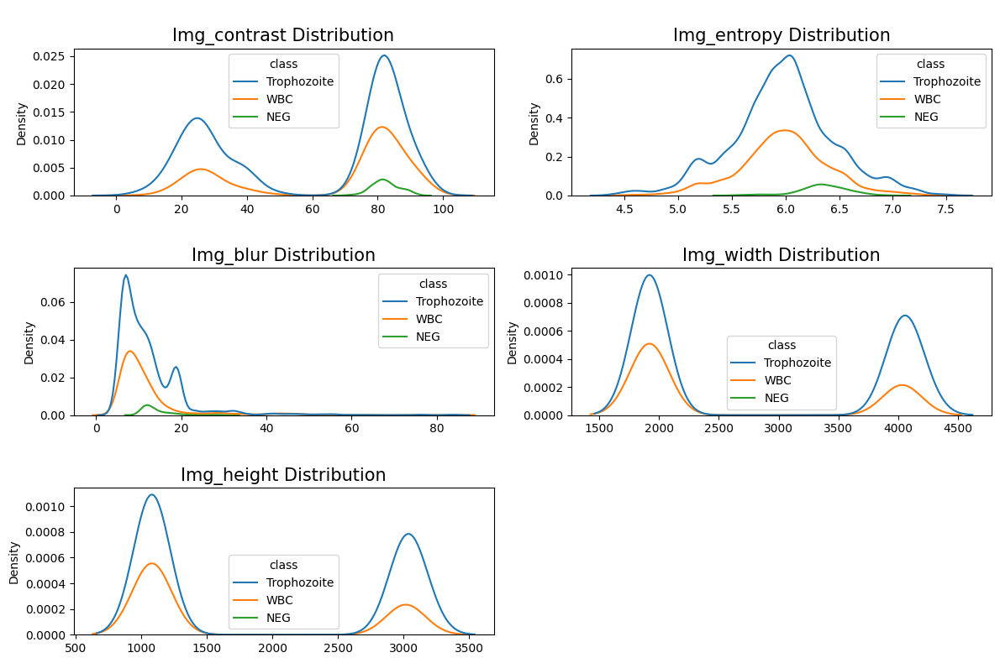

In [64]:
fig=plt.subplots(figsize=(12, 8))

for i,col  in enumerate(['img_contrast','img_entropy', 'img_blur','img_width','img_height']):    

    _=plt.subplot(3,2,i+1,)

    sns.kdeplot(data=train_image_basic_info,

                     hue='class',x=col,)

    _=plt.title(f"\n{col.capitalize()} Distribution",fontsize=15)

    _=plt.xlabel("")

    _=plt.xticks(fontsize=10)

    _=plt.tight_layout()

plt.show()

In [65]:
train_image_basic_info.groupby(['class'])[['img_width','img_height','img_contrast','img_entropy', 'img_blur']].describe().reset_index()

class img_width                                                    \
                   count         mean          std     min     25%     50%   
0          NEG     688.0  4000.000000     0.000000  4000.0  4000.0  4000.0   
1  Trophozoite   15838.0  2839.853517  1060.405437  1920.0  1920.0  1920.0   
2          WBC    7004.0  2545.398058   964.287679  1920.0  1920.0  1920.0   

                  img_height                                                   \
      75%     max      count         mean         std     min     25%     50%   
0  4000.0  4000.0      688.0  3000.000000    0.000000  3000.0  3000.0  3000.0   
1  4032.0  4160.0    15838.0  1921.906806  970.436119  1080.0  1080.0  1080.0   
2  4032.0  4032.0     7004.0  1653.281553  883.930372  1080.0  1080.0  1080.0   

                  img_contrast                                             \
      75%     max        count       mean        std    min    25%    50%   
0  3000.0  3000.0        688.0  82.414811   4.222758  69.77  79.60  81.97   
1  3016.0  3120.0      15838.0  58.953264  28.605968   5.19  26.91  77.88   
2  3016.0  3016.0       7004.0  66.512523  25.929521   6.16  34.88  79.21   

                img_entropy                                                    \
     75%    max       count      mean       std   min   25%   50%   75%   max   
0  85.07  92.87       688.0  6.344113  0.238943  5.52  6.22  6.35  6.50  6.97   
1  82.63  96.47     15838.0  5.968302  0.478240  4.39  5.70  5.97  6.23  7.53   
2  83.71  96.41      7004.0  5.983218  0.418096  4.47  5.75  5.99  6.22  7.53   

  img_blur                                                          
     count       mean       std   min    25%    50%     75%    max  
0    688.0  14.075131  3.843003  9.89  11.60  12.74  15.165  30.50  
1  15838.0  12.146748  8.078192  3.88   7.13  10.03  14.180  84.18  
2   7004.0  11.912780  9.259338  3.89   7.19   9.25  12.330  84.18

#### The above summary explains that the images widths range from 1920 to 4160

#### The compressed images heights range from 1080 to 3120.


#### Let's see number of colors in each image

In [66]:
def count_colors(df):

    n=[]

    for im in tqdm(df['Image_ID'].unique()):

        ims=Image.open(f"{train_image_path}{im}")

        #if len(ims.getcolors(ims.size[0]*ims.size[1]))<10:

        n.append(len(ims.getcolors(ims.size[0]*ims.size[1])))

    return n

In [67]:
train_df_image_unique_colors=count_colors(train)

  0%|          | 0/2747 [00:00<?, ?it/s]

In [68]:
train = pd.merge(train,pd.DataFrame({'Image_ID':train['Image_ID'].unique(),'no_of_colors':train_df_image_unique_colors}),how='left',on='Image_ID')

#### Let's see images with low colors

In [69]:
train['no_of_colors'].describe()

count     23530.000000
mean      54305.774543
std       24614.901603
min       11477.000000
25%       37769.000000
50%       49517.000000
75%       63883.000000
max      212832.000000
Name: no_of_colors, dtype: float64

In [70]:
train[train['no_of_colors']<11500]['Image_ID']

29       id_vmj225uyxh.jpg
1264     id_vmj225uyxh.jpg
14339    id_vmj225uyxh.jpg
20952    id_vmj225uyxh.jpg
Name: Image_ID, dtype: object

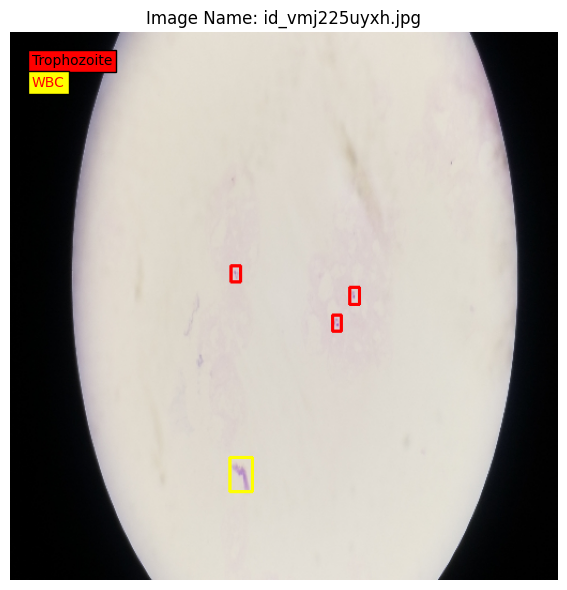

In [71]:
show_image_with_annotation(train,

                           train[train['no_of_colors']<11500]['Image_ID'].values,

                           bbox_line_size=2)

#### Let's view sample images with low contrast

In [72]:
train_image_basic_info['img_contrast'].describe()

count    23530.000000
mean        61.889371
std         27.854998
min          5.190000
25%         28.560000
50%         78.730000
75%         83.047500
max         96.470000
Name: img_contrast, dtype: float64

In [73]:
train_image_basic_info[train_image_basic_info['img_contrast']<5.3]

,Image_ID,img_mode,img_width,img_height,img_contrast,img_entropy,img_blur,class
6110,id_6nolb218pj.jpg,RGB,4032,3016,5.19,4.65,4.58,Trophozoite
6111,id_6nolb218pj.jpg,RGB,4032,3016,5.19,4.65,4.58,Trophozoite
6112,id_6nolb218pj.jpg,RGB,4032,3016,5.19,4.65,4.58,Trophozoite
6113,id_6nolb218pj.jpg,RGB,4032,3016,5.19,4.65,4.58,Trophozoite
6114,id_6nolb218pj.jpg,RGB,4032,3016,5.19,4.65,4.58,Trophozoite
6115,id_6nolb218pj.jpg,RGB,4032,3016,5.19,4.65,4.58,Trophozoite
6116,id_6nolb218pj.jpg,RGB,4032,3016,5.19,4.65,4.58,Trophozoite
6117,id_6nolb218pj.jpg,RGB,4032,3016,5.19,4.65,4.58,Trophozoite
6118,id_6nolb218pj.jpg,RGB,4032,3016,5.19,4.65,4.58,Trophozoite


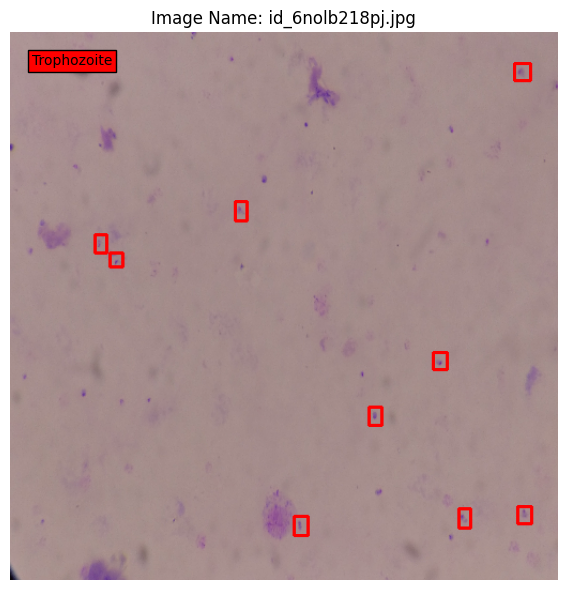

In [74]:
show_image_with_annotation(train,

                           train_image_basic_info[train_image_basic_info['img_contrast']<5.3]['Image_ID'],
                           bbox_line_size=2)
    
                           

#### Let's view sample images with high contrast

In [75]:
train_image_basic_info[train_image_basic_info['img_contrast']>96]

,Image_ID,img_mode,img_width,img_height,img_contrast,img_entropy,img_blur,class
13452,id_7yurhvqp72.jpg,RGB,1920,1080,96.41,5.03,22.79,Trophozoite
13453,id_7yurhvqp72.jpg,RGB,1920,1080,96.41,5.03,22.79,WBC
13454,id_7yurhvqp72.jpg,RGB,1920,1080,96.41,5.03,22.79,Trophozoite
13455,id_7yurhvqp72.jpg,RGB,1920,1080,96.41,5.03,22.79,Trophozoite
13456,id_7yurhvqp72.jpg,RGB,1920,1080,96.41,5.03,22.79,Trophozoite
13457,id_7yurhvqp72.jpg,RGB,1920,1080,96.41,5.03,22.79,Trophozoite
23490,id_j44lw6vp5j.jpg,RGB,1920,1080,96.47,4.94,27.24,Trophozoite


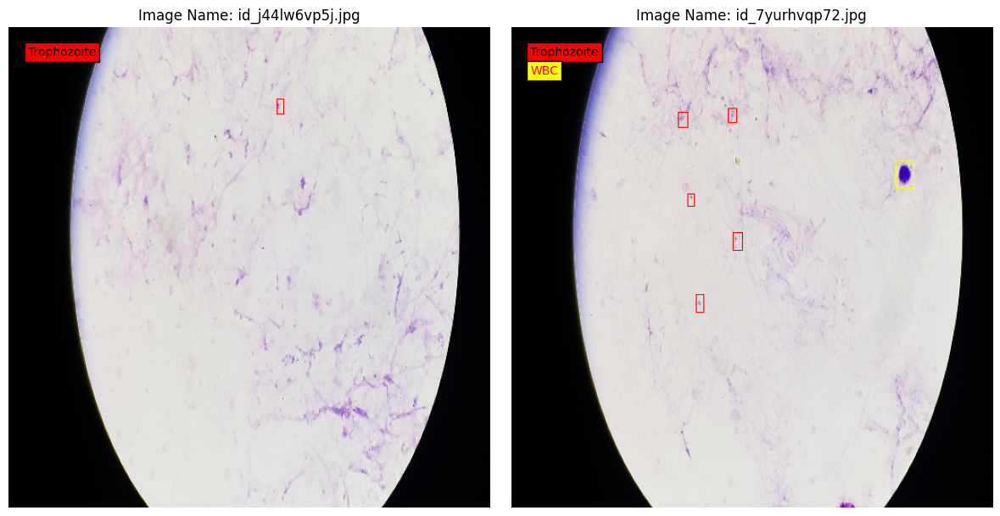

In [76]:
show_image_with_annotation(train,

                           train_image_basic_info[train_image_basic_info['img_contrast']>96]['Image_ID'].values,

                           n_col=2,n_row=1)

#### Let's view sample images with low entropy

In [77]:
train_image_basic_info['img_entropy'].describe()

count    23530.000000
mean         5.983730
std          0.459996
min          4.390000
25%          5.720000
50%          6.000000
75%          6.250000
max          7.530000
Name: img_entropy, dtype: float64

In [78]:
train_image_basic_info[train_image_basic_info['img_entropy']<4.40]

,Image_ID,img_mode,img_width,img_height,img_contrast,img_entropy,img_blur,class
20301,id_s7ow36yu87.jpg,RGB,4032,3016,8.69,4.39,4.7,Trophozoite
20302,id_s7ow36yu87.jpg,RGB,4032,3016,8.69,4.39,4.7,Trophozoite
20303,id_s7ow36yu87.jpg,RGB,4032,3016,8.69,4.39,4.7,Trophozoite
20304,id_s7ow36yu87.jpg,RGB,4032,3016,8.69,4.39,4.7,Trophozoite
20305,id_s7ow36yu87.jpg,RGB,4032,3016,8.69,4.39,4.7,Trophozoite
20306,id_s7ow36yu87.jpg,RGB,4032,3016,8.69,4.39,4.7,Trophozoite
20307,id_s7ow36yu87.jpg,RGB,4032,3016,8.69,4.39,4.7,Trophozoite
20308,id_s7ow36yu87.jpg,RGB,4032,3016,8.69,4.39,4.7,Trophozoite
20309,id_s7ow36yu87.jpg,RGB,4032,3016,8.69,4.39,4.7,Trophozoite
20310,id_s7ow36yu87.jpg,RGB,4032,3016,8.69,4.39,4.7,Trophozoite


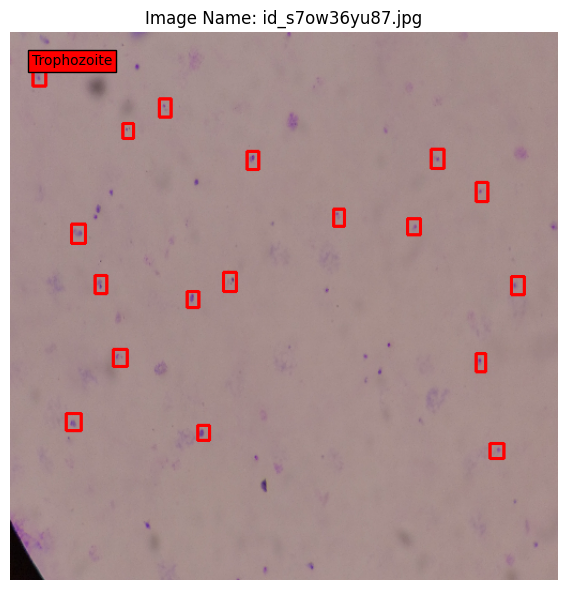

In [79]:
show_image_with_annotation(train,

                           train_image_basic_info[train_image_basic_info['img_entropy']<4.40]['Image_ID'],
                           bbox_line_size=2

                          )

#### Let's view images with high entropy

In [80]:
train_image_basic_info[train_image_basic_info['img_entropy']>7.5]

,Image_ID,img_mode,img_width,img_height,img_contrast,img_entropy,img_blur,class
17043,id_c9x4xc9vuv.jpg,RGB,4032,3016,53.63,7.53,12.02,Trophozoite
17044,id_c9x4xc9vuv.jpg,RGB,4032,3016,53.63,7.53,12.02,Trophozoite
17045,id_c9x4xc9vuv.jpg,RGB,4032,3016,53.63,7.53,12.02,WBC
17046,id_c9x4xc9vuv.jpg,RGB,4032,3016,53.63,7.53,12.02,Trophozoite
17047,id_c9x4xc9vuv.jpg,RGB,4032,3016,53.63,7.53,12.02,WBC
17048,id_c9x4xc9vuv.jpg,RGB,4032,3016,53.63,7.53,12.02,Trophozoite
17049,id_c9x4xc9vuv.jpg,RGB,4032,3016,53.63,7.53,12.02,WBC
17050,id_c9x4xc9vuv.jpg,RGB,4032,3016,53.63,7.53,12.02,WBC
17051,id_c9x4xc9vuv.jpg,RGB,4032,3016,53.63,7.53,12.02,Trophozoite
17052,id_c9x4xc9vuv.jpg,RGB,4032,3016,53.63,7.53,12.02,WBC


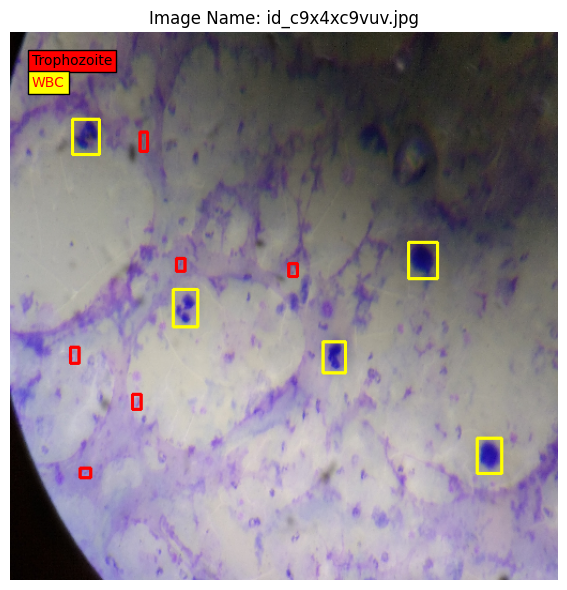

In [81]:
show_image_with_annotation(train,

                           train_image_basic_info[train_image_basic_info['img_entropy']>7.5]['Image_ID'].values,

                           bbox_line_size=2)

#### Let's view sample images with low blur

In [82]:
train_image_basic_info['img_blur'].describe()

count    23530.000000
mean        12.133489
std          8.366439
min          3.880000
25%          7.190000
50%          9.870000
75%         13.550000
max         84.180000
Name: img_blur, dtype: float64

In [83]:
train_image_basic_info[train_image_basic_info['img_blur']<3.9]

,Image_ID,img_mode,img_width,img_height,img_contrast,img_entropy,img_blur,class
19052,id_gnkvf07r9a.jpg,RGB,4032,3016,16.37,5.34,3.89,WBC
19053,id_gnkvf07r9a.jpg,RGB,4032,3016,16.37,5.34,3.89,WBC
19054,id_gnkvf07r9a.jpg,RGB,4032,3016,16.37,5.34,3.89,Trophozoite
19055,id_gnkvf07r9a.jpg,RGB,4032,3016,16.37,5.34,3.89,WBC
19056,id_gnkvf07r9a.jpg,RGB,4032,3016,16.37,5.34,3.89,Trophozoite
19057,id_gnkvf07r9a.jpg,RGB,4032,3016,16.37,5.34,3.89,WBC
19058,id_gnkvf07r9a.jpg,RGB,4032,3016,16.37,5.34,3.89,WBC
19059,id_gnkvf07r9a.jpg,RGB,4032,3016,16.37,5.34,3.89,WBC
19060,id_gnkvf07r9a.jpg,RGB,4032,3016,16.37,5.34,3.89,WBC
19061,id_gnkvf07r9a.jpg,RGB,4032,3016,16.37,5.34,3.89,Trophozoite


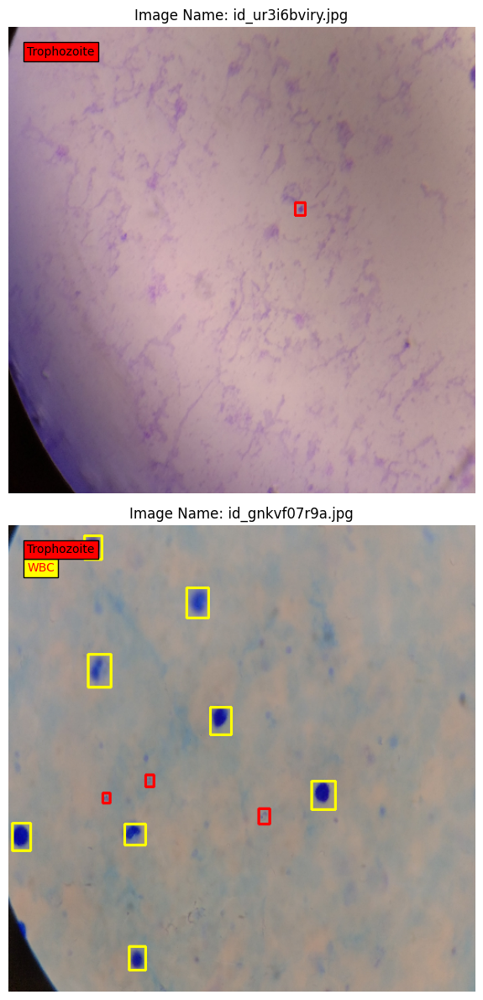

In [84]:
show_image_with_annotation(train,

                           train_image_basic_info[train_image_basic_info['img_blur']<3.9]['Image_ID'],
                           bbox_line_size=2

                           )

#### Let's view sample images with high blur

In [85]:
train_image_basic_info[train_image_basic_info['img_blur']>84]

,Image_ID,img_mode,img_width,img_height,img_contrast,img_entropy,img_blur,class
15094,id_jd4i30cqy7.jpg,RGB,1920,1080,93.06,5.59,84.18,Trophozoite
15095,id_jd4i30cqy7.jpg,RGB,1920,1080,93.06,5.59,84.18,Trophozoite
15096,id_jd4i30cqy7.jpg,RGB,1920,1080,93.06,5.59,84.18,Trophozoite
15097,id_jd4i30cqy7.jpg,RGB,1920,1080,93.06,5.59,84.18,WBC
15098,id_jd4i30cqy7.jpg,RGB,1920,1080,93.06,5.59,84.18,Trophozoite
15099,id_jd4i30cqy7.jpg,RGB,1920,1080,93.06,5.59,84.18,Trophozoite
15100,id_jd4i30cqy7.jpg,RGB,1920,1080,93.06,5.59,84.18,Trophozoite
15101,id_jd4i30cqy7.jpg,RGB,1920,1080,93.06,5.59,84.18,WBC
15102,id_jd4i30cqy7.jpg,RGB,1920,1080,93.06,5.59,84.18,Trophozoite
15103,id_jd4i30cqy7.jpg,RGB,1920,1080,93.06,5.59,84.18,Trophozoite


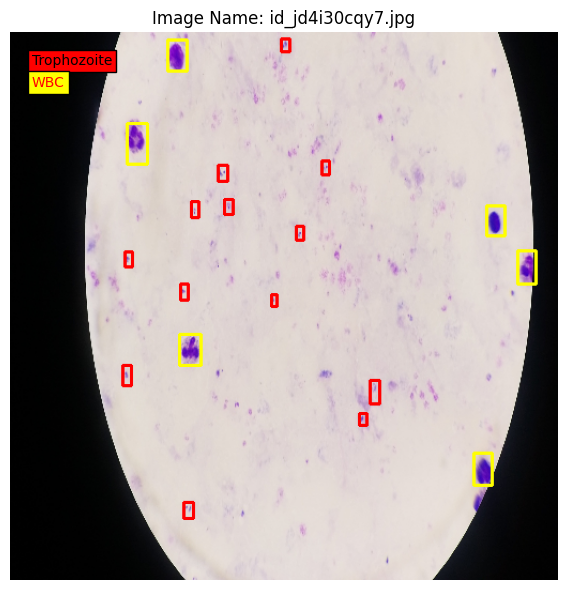

In [86]:
show_image_with_annotation(train,

                           train_image_basic_info[train_image_basic_info['img_blur']>84]['Image_ID'],
                           bbox_line_size=2

                           )

## Test data analysis

#### Let's see images with low colors in test dataset

In [87]:
test_df_image_unique_colors=count_colors(test)



test=pd.merge(test,pd.DataFrame({'Image_ID':test['Image_ID'].unique(),'no_of_colors':test_df_image_unique_colors}),how='left',on='Image_ID')

  0%|          | 0/1178 [00:00<?, ?it/s]

In [88]:
test['no_of_colors'].describe()

count      1178.000000
mean      65089.179117
std       32851.183127
min       10807.000000
25%       39510.250000
50%       57161.000000
75%       87107.250000
max      184572.000000
Name: no_of_colors, dtype: float64

In [89]:


test[test['no_of_colors']<11000]

,Image_ID,class,confidence,ymin,xmin,ymax,xmax,no_of_colors
627,id_v5f29ajik8.jpg,NaN,NaN,NaN,NaN,NaN,NaN,10807


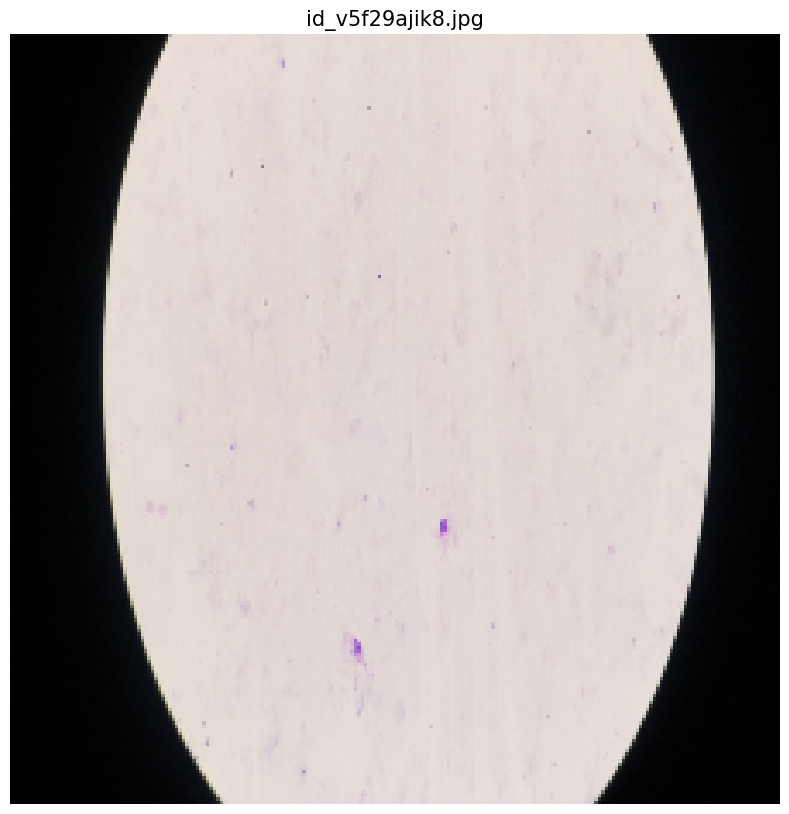

In [90]:
fig=plt.figure(figsize=(15,10))

for i,img in enumerate(test[test['no_of_colors']<11000]['Image_ID'].unique()):

    ax=plt.subplot(1,1,i+1)

    ax.imshow(img_read(f"{train_image_path}",img,new_size=224))

    ax.set_title(f"{img}",fontsize=15)

    ax.axis("off")

plt.show()

#### Let's extract basic information about the image like width, height for compressed test image dataset.

In [91]:
test_image_basic_info = basic_image_info(test, 'Image_ID', train_image_path)


test_image_basic_info = pd.merge(test_image_basic_info,test[['Image_ID']],how='left',on='Image_ID')

Basic Image Information Extraction:   0%|          | 0/1178 [00:00<?, ?it/s]

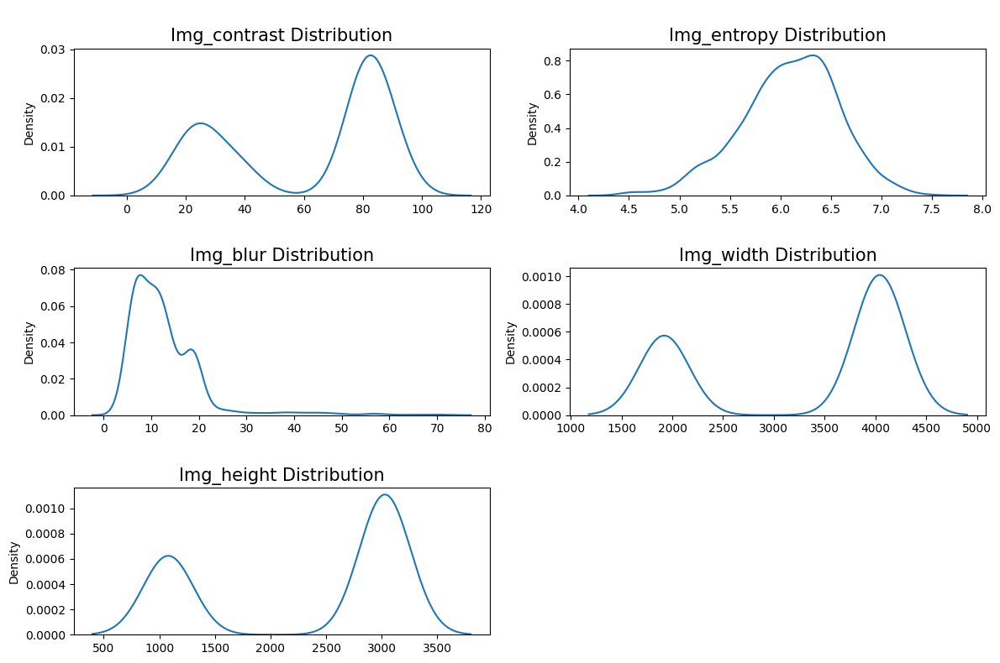

In [92]:
fig=plt.subplots(figsize=(12, 8))

for i,col  in enumerate(['img_contrast','img_entropy', 'img_blur','img_width','img_height']):    

    _=plt.subplot(3,2,i+1,)

    sns.kdeplot(data=test_image_basic_info,

                     x=col,)

    _=plt.title(f"\n{col.capitalize()} Distribution",fontsize=15)

    _=plt.xlabel("")

    _=plt.xticks(fontsize=10)

    _=plt.tight_layout()

plt.show()

In [93]:
test_image_basic_info[['img_width','img_height','img_contrast','img_entropy', 'img_blur']].describe()

,img_width,img_height,img_contrast,img_entropy,img_blur
count,1178.000000,1178.000000,1178.000000,1178.000000,1178.000000
mean,3288.855688,2336.448217,61.030382,6.092784,12.630059
std,1018.573678,934.625698,27.905538,0.477376,7.894790
min,1920.000000,1080.000000,8.740000,4.450000,3.420000
25%,1920.000000,1080.000000,28.982500,5.800000,7.252500
50%,4000.000000,3000.000000,78.200000,6.130000,11.110000
75%,4032.000000,3016.000000,83.467500,6.420000,15.125000
max,4160.000000,3120.000000,96.190000,7.500000,71.310000
